<a href="https://colab.research.google.com/github/MiguelSca/ProjectUAL2021/blob/main/Data_Mining_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DATA UNDERSTANDING

###METADATA

####Variable Description
CUSTID customer ID number

*   DAYSWUS number of days as a customer 
*   AGE customer's age
*   EDUCATION years of education
*   INCOME household income 
*   KIDHOME 1=has child under 13 yo living at home 
*   TEENHOME 1=has teen (13 to 19 yo) living at home 
*   FREQ number of purchases in past 18 months
*   RECENCY number of days since last purchase
*   MONETARY total sales to this person in past 18 months
*   LTV customer lifetime value
*   PERDEAL % purchases bought on discount (units)
*   DRYRED % of wines that were dry red wines 
*   SWEETRED % of wines that were sweet red wines
*   DRYWH % of wines that were dry white wines 
*   SWEETWH % of wines that were sweet white wines 
*   DESSERT % of wines that were dessert wines (port, sherry,
etc.) 
*   EXOTIC % of wines that were exotic wines 
*   WEBPURCH % of purchases made on website/app 
*   WEBVISIT average number of visits to website/app per month
*   ACCESS number of accessories bought in past 18 months

Note: DRYRED + SWEETRED + DRYWH + SWEETWH + DESSERT = 100%

###Intial setup and modules / Package loading

In [ ]:
# Install updated version of pandas_profiling.
!pip install pandas_profiling==3.3.0



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Packages
import os
import csv

import matplotlib.pyplot as plt

from matplotlib import ticker

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import seaborn as sns
from math import ceil

from itertools import product
from pandas_profiling import ProfileReport

import sqlite3
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans

import numpy as np
import pandas as pd

sns.set()

ImportError: ignored

In [ ]:
data_path = "https://raw.githubusercontent.com/MaJoCedeno/DMDM/main/WonderfulWinesWorld_Clustering_DMDM2022e23.xlsx%20-%20www_customer_table.csv"
ds = pd.read_csv(data_path)

In [ ]:
## Some configuration

%matplotlib inline

# for better resolution plots
%config InlineBackend.figure_format = 'retina'

# Set seaborn style
sns.set()

##Data Understanding

In [ ]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   Custid       10000 non-null  int64
 1   Dayswus      10000 non-null  int64
 2   Age          10000 non-null  int64
 3   Educ         10000 non-null  int64
 4   Income       10000 non-null  int64
 5   Kidhome      10000 non-null  int64
 6   Teenhome     10000 non-null  int64
 7   Freq         10000 non-null  int64
 8   Recency      10000 non-null  int64
 9   Monetary     10000 non-null  int64
 10  LTV          10000 non-null  int64
 11  Perdeal      10000 non-null  int64
 12  Dryred       10000 non-null  int64
 13  Sweetred     10000 non-null  int64
 14  Drywh        10000 non-null  int64
 15  Sweetwh      10000 non-null  int64
 16  Dessert      10000 non-null  int64
 17  Exotic       10000 non-null  int64
 18  WebPurchase  10000 non-null  int64
 19  WebVisit     10000 non-null  int64
 20  Access 

In [ ]:
ds.head(10).T

,0,1,2,3,4,5,6,7,8,9
Custid,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010
Dayswus,789,623,583,893,1062,792,1120,658,792,1109
Age,68,78,24,59,59,32,45,54,74,20
Educ,16,20,18,19,18,20,17,18,18,14
Income,90782,113023,28344,93571,91852,22386,69485,68602,109499,23846
Kidhome,0,0,1,0,0,1,1,0,0,1
Teenhome,0,0,0,1,1,1,1,1,0,0
Freq,29,31,4,21,25,5,11,2,29,1
Recency,66,6,69,10,26,65,73,44,75,153
Monetary,1402,1537,44,888,1138,56,345,41,1401,19


In [ ]:
print(str(round(list(ds.Kidhome).count(0)/10000*100,4)) + '% of clients that have a kid living at home (younger than 13 years old)')

58.12% of clients that have a kid living at home (younger than 13 years old)


In [ ]:
print(str(round(list(ds.Teenhome).count(0)/10000*100,4)) + '% of clients that have a teenager living at home (from 13 to 18 years old)')

53.02% of clients that have a teenager living at home (from 13 to 18 years old)


In [ ]:
ds.dtypes

Custid         int64
Dayswus        int64
Age            int64
Educ           int64
Income         int64
Kidhome        int64
Teenhome       int64
Freq           int64
Recency        int64
Monetary       int64
LTV            int64
Perdeal        int64
Dryred         int64
Sweetred       int64
Drywh          int64
Sweetwh        int64
Dessert        int64
Exotic         int64
WebPurchase    int64
WebVisit       int64
Access         int64
dtype: object

In [ ]:
## Check for duplicate rows
ds.duplicated().sum()

0

In [ ]:
# Summary statistics for all variables
ds.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
Custid,10000.0,6000.5000,2886.895680,1001.0,3500.75,6000.5,8500.25,11000.0
Dayswus,10000.0,898.1020,202.492789,550.0,723.75,894.0,1074.00,1250.0
Age,10000.0,47.9273,17.302721,18.0,33.00,48.0,63.00,78.0
Educ,10000.0,16.7391,1.876375,12.0,15.00,17.0,18.00,20.0
Income,10000.0,69904.3580,27612.233311,10000.0,47642.00,70012.0,92147.00,140628.0
Kidhome,10000.0,0.4188,0.493387,0.0,0.00,0.0,1.00,1.0
Teenhome,10000.0,0.4698,0.499112,0.0,0.00,0.0,1.00,1.0
Freq,10000.0,14.6281,11.969073,1.0,4.00,12.0,24.00,56.0
Recency,10000.0,62.4068,69.874255,0.0,26.00,52.0,78.25,549.0
Monetary,10000.0,622.5552,647.135323,6.0,63.00,383.0,1077.00,3052.0


In [ ]:
# Check missing values
print(ds.isnull().sum())

Custid         0
Dayswus        0
Age            0
Educ           0
Income         0
Kidhome        0
Teenhome       0
Freq           0
Recency        0
Monetary       0
LTV            0
Perdeal        0
Dryred         0
Sweetred       0
Drywh          0
Sweetwh        0
Dessert        0
Exotic         0
WebPurchase    0
WebVisit       0
Access         0
dtype: int64


In [ ]:
ds_copy = ds.copy(False)

## Fix wrong data types
ds_copy.Kidhome = ds.Kidhome.astype("boolean")
ds_copy.Teenhome = ds.Teenhome.astype("boolean")

In [ ]:
# Split features 
# We splitted the metric features into buying behaviors and engagement features, mostly because visualization reasons, while doing the Histograms and Boxplots
non_metric_features = ["Kidhome", "Teenhome", "Custid"]
metric_features = ds.columns.drop(non_metric_features).to_list()
buying_behavior_features = ['Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic']
engagement_features = ["Dayswus", "Age", "Educ", "Income", "LTV", "Perdeal", "WebPurchase", "WebVisit", "Access", "Recency", "Freq", "Monetary"]
# RFM_features = ["Recency", "Freq", "Monetary"]


In [ ]:
metric_features

['Dayswus',
 'Age',
 'Educ',
 'Income',
 'Freq',
 'Recency',
 'Monetary',
 'LTV',
 'Perdeal',
 'Dryred',
 'Sweetred',
 'Drywh',
 'Sweetwh',
 'Dessert',
 'Exotic',
 'WebPurchase',
 'WebVisit',
 'Access']

In [ ]:
engagement_features

['Dayswus',
 'Age',
 'Educ',
 'Income',
 'LTV',
 'Perdeal',
 'WebPurchase',
 'WebVisit',
 'Access',
 'Recency',
 'Freq',
 'Monetary']

In [ ]:
ds.dtypes

Custid         int64
Dayswus        int64
Age            int64
Educ           int64
Income         int64
Kidhome        int64
Teenhome       int64
Freq           int64
Recency        int64
Monetary       int64
LTV            int64
Perdeal        int64
Dryred         int64
Sweetred       int64
Drywh          int64
Sweetwh        int64
Dessert        int64
Exotic         int64
WebPurchase    int64
WebVisit       int64
Access         int64
dtype: object

Summary statistics show:

There are no missing values. Most of the customers do not buy an accesory while buying wine.

## Visual Exploration

###Univariate Distribution

In [ ]:
## Define a function that plots multiple histograms

def plot_multiple_histograms(data, feats, title="Engagement Features Histograms"):

    # Prepare figure. Create individual axes where each histogram will be placed
    fig, axes = plt.subplots(2, ceil(len(feats) / 2), figsize=(20, 11))

    # Plot data
    # Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
    for ax, feat in zip(axes.flatten(), feats): # Notice the zip() function and flatten() method
      ax.hist(data[feat])
      ax.set_title(feat)

    # Layout
    # Add a centered title to the figure:
    plt.suptitle(title)

    plt.show()

    return

In [ ]:
# All Engagement Features Histograms in one figure
sns.set()
plot_multiple_histograms(ds_copy, engagement_features)

NameError: ignored

In [ ]:
# All Buying Behavior Histograms in one figure
sns.set()
plot_multiple_histograms(ds_copy, buying_behavior_features, "Buying behavior Histograms")

NameError: ignored

In [ ]:
## Define a function that plots multiple box plots

def plot_multiple_boxplots(data, feats, title="Engagement features Box Plots"):

    # Prepare figure. Create individual axes where each histogram will be placed
    fig, axes = plt.subplots(2, ceil(len(feats) / 2), figsize=(20, 11))

    # Plot data
    # Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
    for ax, feat in zip(axes.flatten(), feats): # Notice the zip() function and flatten() method
      sns.boxplot(x=data[feat], ax=ax)
      ax.set_title(feat)

    # Layout
    # Add a centered title to the figure:
    plt.suptitle(title)

    plt.show()

    return

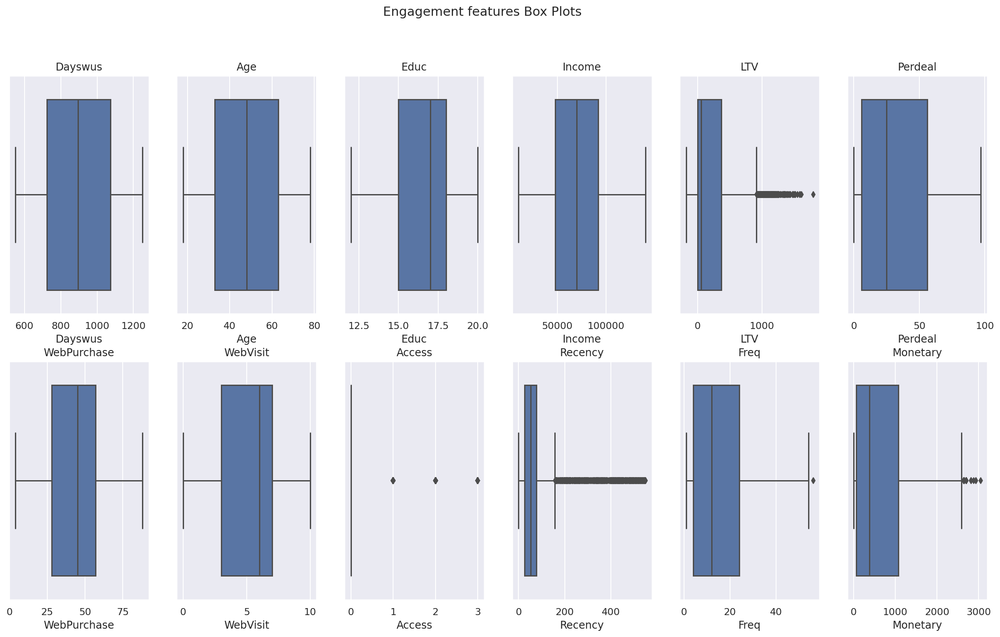

In [ ]:
# All Engagement Variables Boxplots in one figure
sns.set()
plot_multiple_boxplots(ds, engagement_features)

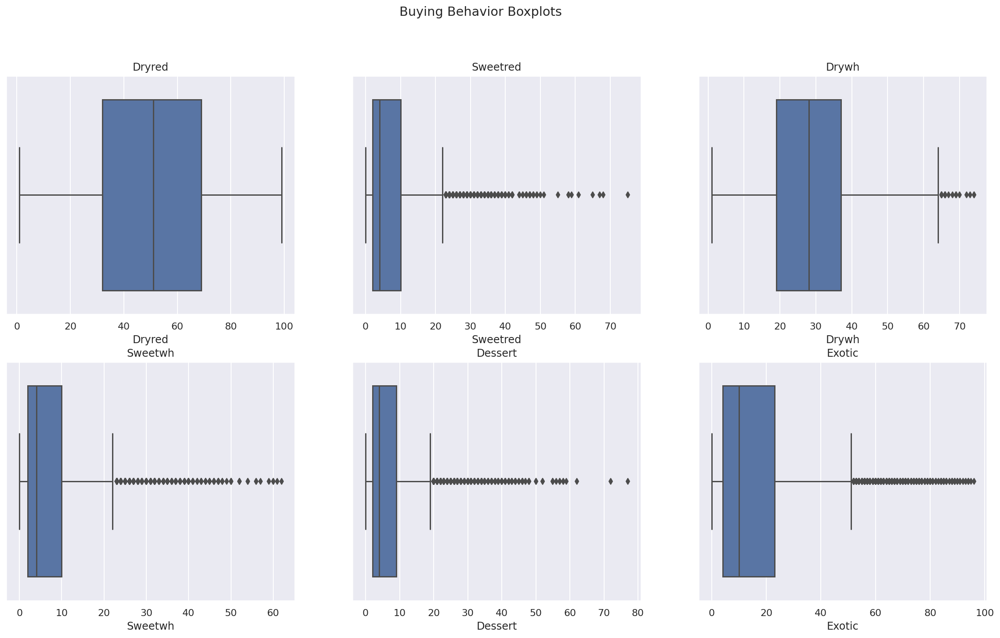

In [ ]:
# All Buying Behavior Boxplots in one figure
sns.set()
plot_multiple_boxplots(ds, buying_behavior_features, "Buying Behavior Boxplots")

###Pairwise Relationship of Numeric Values

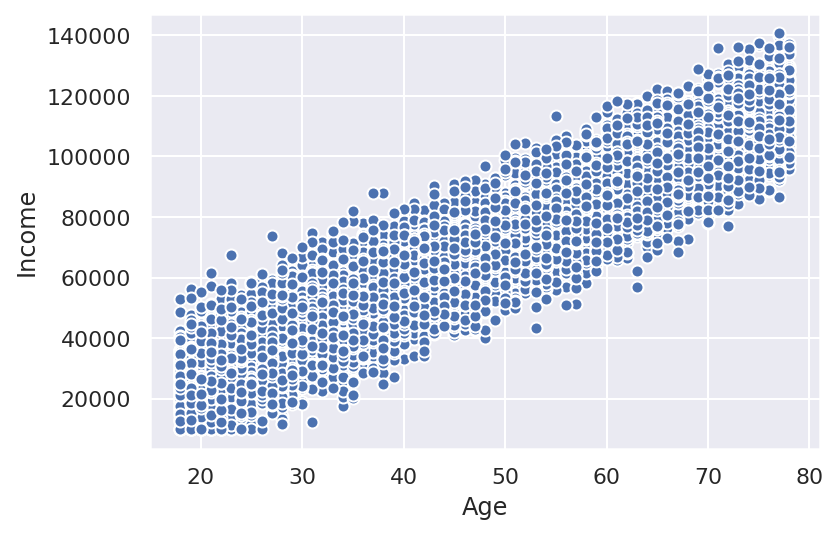

In [ ]:
# Single Metric Variable Scatter plot
plt.scatter(ds["Age"], ds["Income"], edgecolors="white")
plt.xlabel("Age")
plt.ylabel("Income")
plt.show()

###Pairwise relationship between numeric and categoric values

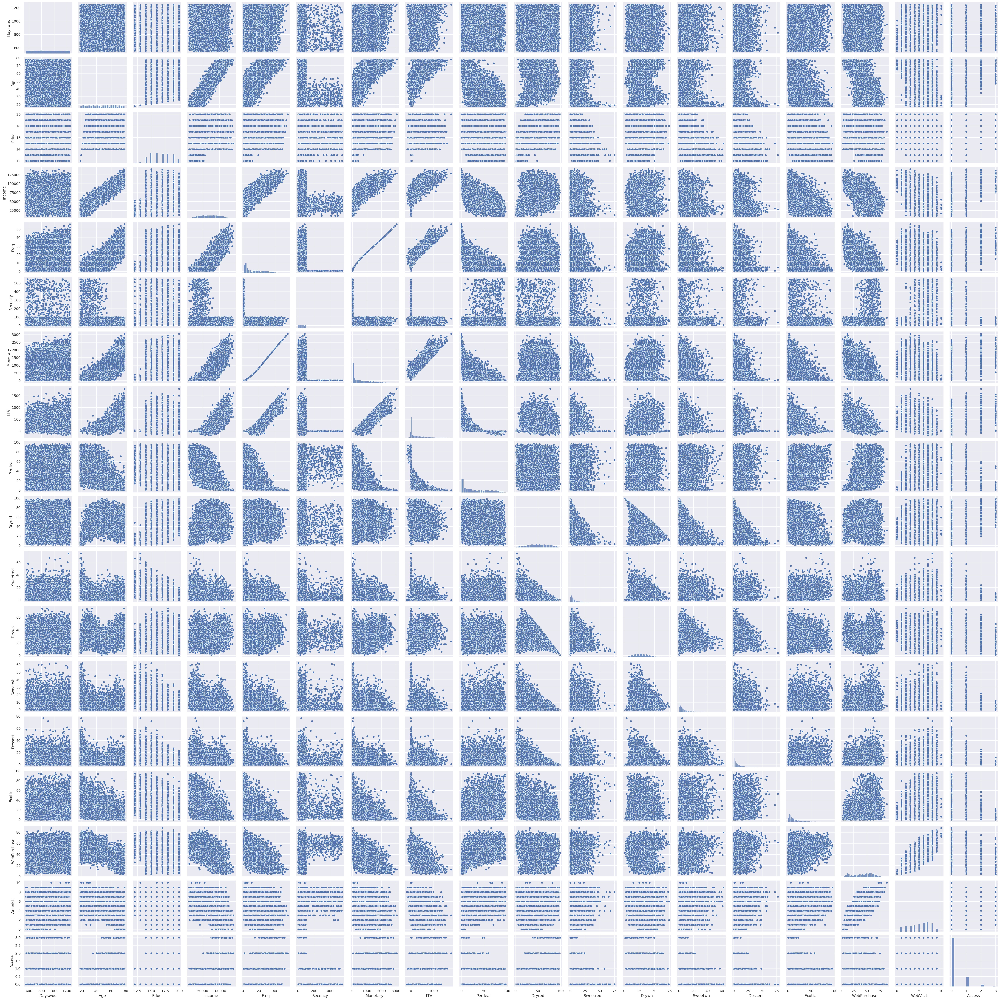

In [ ]:
# Setting pairplot
sns.pairplot(ds[metric_features])


###Bolean features frequency

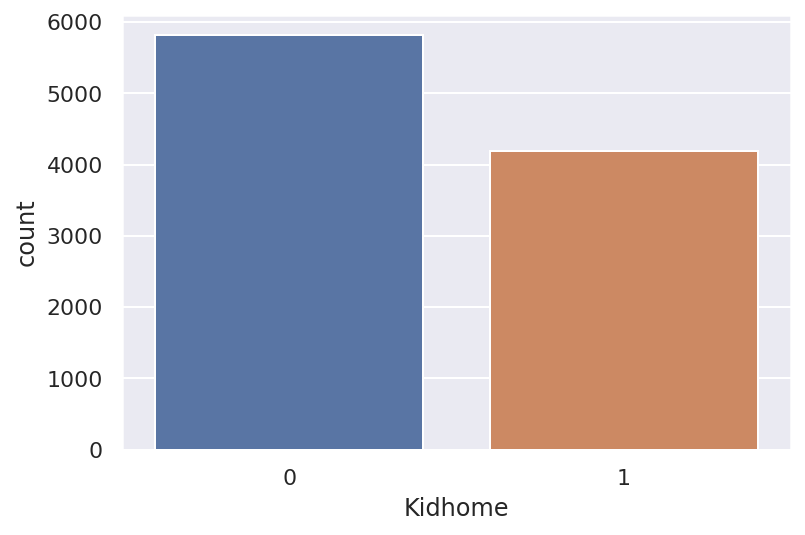

In [ ]:
# Single Non-Metric variable bar plot
sns.set()
sns.countplot(x=ds["Kidhome"])
plt.show()

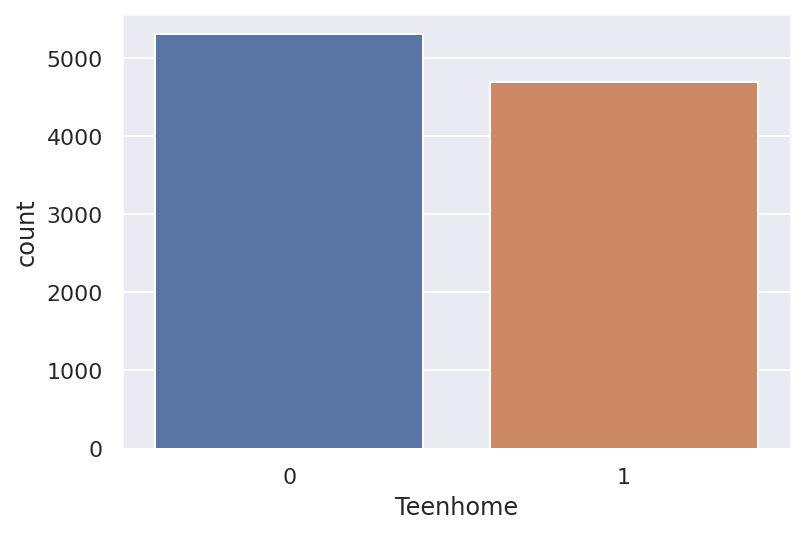

In [ ]:
sns.set()
sns.countplot(x=ds["Teenhome"])
plt.show()

###Metric Values Correlation Matrix

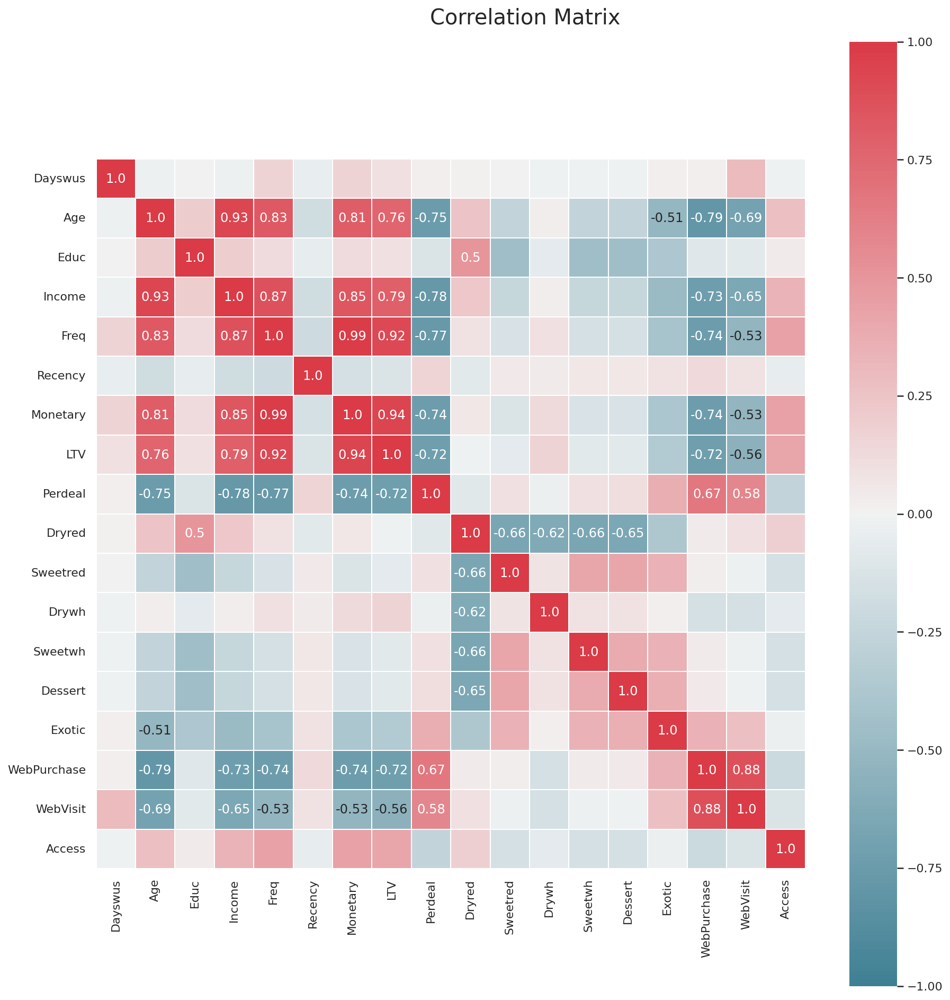

In [ ]:
# Prepare figure
fig = plt.figure(figsize=(15, 15))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(ds[metric_features].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

# DATA PREPARATION

##Outlier Removal

###Manual Removal

In [ ]:
# All Buying Behavior Boxplots in one figure
sns.set()
plot_multiple_boxplots(ds, buying_behavior_features, "Buying Behavior Boxplots")

In [ ]:
filters1 = (
    (ds['Sweetred']<=40)
    &
    (ds['Drywh']<=65)
    &
    (ds['Sweetwh']<=50)
    &
    (ds['Dessert']<=45)
    &
    (ds['Exotic']<=60)
)

ds_1 = ds[filters1]

In [ ]:
print('Percentage of data kept after removing outliers:', np.round(ds_1.shape[0] / ds.shape[0], 4))

###Outlier Removal Using IQR Method

In [ ]:
q25 = ds[metric_features].quantile(.25)
q75 = ds[metric_features].quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters2 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters2.append(ds[metric].between(llim, ulim, inclusive=True))

filters2 = pd.Series(np.all(filters2, 0))
ds_2 = ds[filters2]
print('Percentage of data kept after removing outliers:', np.round(ds_2.shape[0] / ds.shape[0], 4))

###Combining different outlier methods

In [ ]:
ds_3 = ds[(filters1 | filters2)]
print('Percentage of data kept after removing outliers:', np.round(ds_3.shape[0] / ds.shape[0], 4))

In [ ]:
#Manual filtering method is as accurate as with combining the two methods so we will use Manual filtering
ds = ds_1.copy()

##Feature Engineering

In [ ]:
# How can we avoid having as many extreme values in 'Recency'?
print((ds['Recency']>100).value_counts())

rcn_t = ds['Recency'].copy()
rcn_t.loc[rcn_t>100] = 100

ds['Recency'] = rcn_t

In [ ]:
#Quantity of products sold by type of wine
#ds['perct_dryred'] = ds['Dryred']
#ds['Dryred'] = (ds['perct_dryred'] / 100) * ds['monetary']

In [ ]:
ds['Childhome'] = ds['Kidhome']+ds['Teenhome']>0
    

In [ ]:
ds.dtypes['Childhome']

##Data Normalization

###MinMax Method

In [ ]:
ds_minmax = ds.copy()

In [ ]:
# Use MinMaxScaler to scale the data
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(ds_minmax[metric_features])
scaled_feat

In [ ]:
# See what the fit method is doing (notice the trailing underscore):
print("Parameters fitted:\n", scaler.data_min_, "\n", scaler.data_max_)

In [ ]:
ds_minmax[metric_features] = scaled_feat
ds_minmax[metric_features].head()

In [ ]:
# Checking max and min of minmaxed variables
ds_minmax[metric_features].describe().round(2)

###Standardization Method

In [ ]:
ds_standard = ds.copy()
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(ds_standard[metric_features])
scaled_feat

In [ ]:
# See what the fit method is doing (notice the trailing underscore):
print("Parameters fitted:\n", scaler.mean_, "\n", scaler.var_)

In [ ]:
ds_standard[metric_features] = scaled_feat
ds_standard.head()

In [ ]:
# Checking mean and variance of standardized variables
ds_standard[metric_features].describe().round(2)

In [ ]:
ds= ds_standard.copy()

##Dimensionality Reduction

# Nova secção

In [ ]:
ds_pca = ds.copy()
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(ds_pca[metric_features])
pca_feat 

###How many Principal Components to retain?

In [ ]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

In [ ]:
def plot_scree_variance(pca):    
    # figure and axes
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # draw plots
    ax1.plot(pca.explained_variance_, marker=".", markersize=12)
    ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
    ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

    # customizations
    ax2.legend()
    ax1.set_title("Scree Plot", fontsize=14)
    ax2.set_title("Variance Explained", fontsize=14)
    ax1.set_ylabel("Eigenvalue")
    ax2.set_ylabel("Proportion")
    ax1.set_xlabel("Components")
    ax2.set_xlabel("Components")
    ax1.set_xticks(range(0, pca.n_components_, 2))
    ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
    ax2.set_xticks(range(0, pca.n_components_, 2))
    ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

    plt.show()

In [ ]:
plot_scree_variance(pca)

In [ ]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=4)
pca_feat = pca.fit_transform(ds_pca[metric_features])
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_ds = pd.DataFrame(pca_feat, index=ds_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_ds

In [ ]:
# Reassigning df to contain pca variables
ds_pca = pd.concat([ds_pca, pca_ds], axis=1)
ds_pca.head()

In [ ]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = ds_pca[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

In [ ]:
ds = ds_pca.copy()

In [ ]:
# Do this after checking the new pandas profiling report
ds.drop(columns=['PC3'], inplace=True)

#MODELING

##Hierarchical Clustering

In [ ]:
# Performing HC
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=5)
hc_labels = hclust.fit_predict(ds[metric_features])
hc_labels

array([0, 0, 1, ..., 0, 0, 0])

In [ ]:
# Characterizing the clusters
ds_concat = pd.concat((ds, pd.Series(hc_labels, name='labels')), axis=1)
ds_concat.groupby('labels').mean()

,Custid,Dayswus,Age,Educ,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,Access,PC0,PC1,PC2
labels,,,,,,,,,,,,,,,,,,,,,
0.0,5422.068493,0.008009,0.008016,0.048504,0.011282,0.391465,0.512645,0.005637,0.014611,0.004613,...,-0.015267,-0.025046,-0.013307,-0.030482,0.007060,0.007238,-0.009476,0.017319,-0.065240,-0.007141
1.0,5413.308745,-0.008019,-0.027037,0.001862,-0.023194,0.399167,0.51041,-0.015976,0.009773,-0.019459,...,-0.017277,-0.013860,0.019436,0.016872,0.010537,0.012039,-0.012855,-0.054727,0.007779,-0.007513
2.0,5449.433800,0.013921,0.030780,-0.003538,0.020693,0.39042,0.495255,0.022589,-0.042454,0.023865,...,0.004503,-0.009015,-0.021660,-0.011735,-0.019691,-0.021897,0.031123,0.071237,-0.022648,0.013710
3.0,5461.969577,0.007810,-0.030010,0.020783,-0.026655,0.387566,0.510582,-0.041082,-0.013024,-0.036673,...,0.018712,0.029406,0.038108,-0.000332,0.012206,0.004961,-0.030000,-0.077620,0.067345,-0.019145
4.0,5475.259878,-0.006289,-0.011197,-0.049133,-0.006861,0.386778,0.494681,0.006423,0.027875,0.006411,...,0.008980,0.034615,0.005397,0.002264,-0.014135,-0.004057,-0.018482,-0.000394,0.048183,0.002752


###Defining the linkage method to use

In [ ]:
# Computing SST
X = ds[metric_features].values
sst = np.sum(np.square(X - X.mean(axis=0)), axis=0)

# Computing SSW
ssw_iter = []
for i in np.unique(hc_labels):
    X_k = X[hc_labels == i]
    ssw_iter.append(np.sum(np.square(X_k - X_k.mean(axis=0)), axis=0))
ssw = np.sum(ssw_iter, axis=0)

# Computing SSB
ssb_iter = []
for i in np.unique(hc_labels):
    X_k = X[hc_labels == i]
    ssb_iter.append(X_k.shape[0] * np.square(X_k.mean(axis=0) - X.mean(axis=0)))
ssb = np.sum(ssb_iter, axis=0)

# Verifying the formula
np.round(sst) == np.round((ssw + ssb))

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True])

In [ ]:
def get_r2_hc(ds, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    ds (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(ds):
        ss = np.sum(ds.var() * (ds.count() - 1))
        return ss  # return sum of sum of squares of each ds variable
    
    sst = get_ss(ds)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(ds) #get cluster labels
        
        
        ds_concat = pd.concat((ds, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        
        
        ssw_labels = ds_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [ ]:
## This function plots the R2 values for each linkage method for cluster sizes from 1 to 10

def plot_r2_linkage(ds, max_nclus):
    # Prepare input
    hc_methods = ["ward", "complete", "average", "single"]
    # Call function defined above to obtain the R2 statistic for each hc_method
    max_nclus = 10
    r2_hc_methods = np.vstack(
        [
            get_r2_hc(ds=ds, link_method=link, max_nclus=max_nclus) 
            for link in hc_methods
        ]
    ).T
    r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

    sns.set()
    # Plot data
    fig = plt.figure(figsize=(11,5))
    sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

    # Finalize the plot
    fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
    plt.gca().invert_xaxis()  # invert x axis
    plt.legend(title="HC methods", title_fontsize=11)
    plt.xticks(range(1, max_nclus + 1))
    plt.xlabel("Number of clusters", fontsize=13)
    plt.ylabel("R2 metric", fontsize=13)

    plt.show()

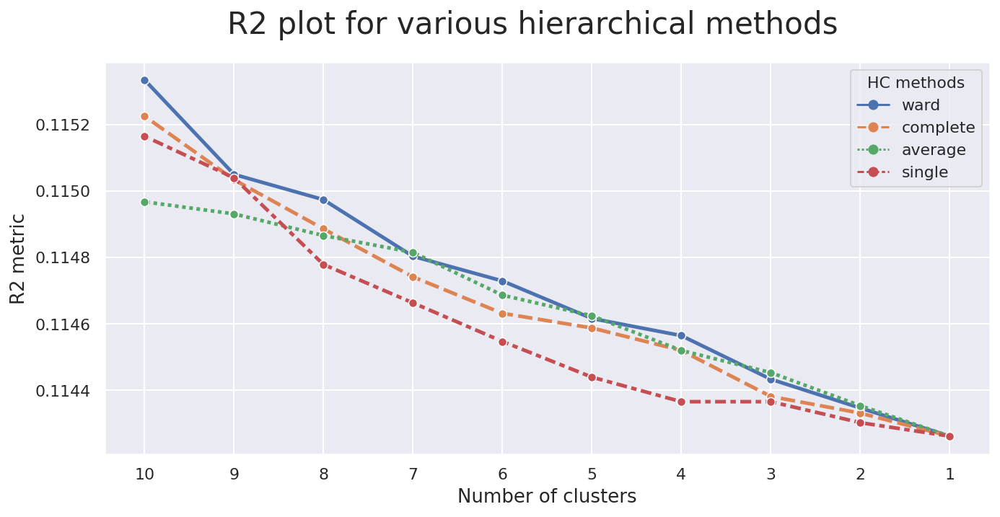

In [ ]:
max_nclus = 10
plot_r2_linkage(ds[metric_features], max_nclus)

###Defining the number of clusters

In [ ]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree

linkage = 'ward'
distance = 'euclidean'

hclust = AgglomerativeClustering(linkage=linkage, 
                                 affinity=distance, 
                                 distance_threshold=0, 
                                 n_clusters=None)

hclust.fit_predict(ds[metric_features])

array([8331, 8430, 7064, ...,    5,    2,    0])

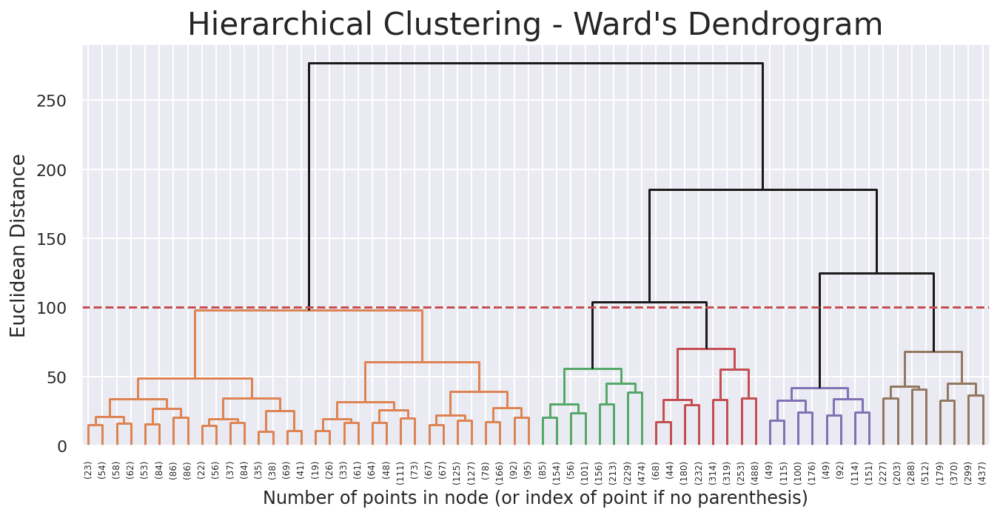

In [ ]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count
   
## Create linkage matrix
# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram

sns.set()
fig = plt.figure(figsize=(11,5))

# The Dendrogram parameters need to be tuned
y_threshold = 100

# "dendrogram" function will plot our dendrogram
dendrogram(linkage_matrix, 
           truncate_mode='level', 
           p=5, 
           color_threshold=y_threshold, 
           above_threshold_color='k')

plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

###Final Hierarchical Clustering Solution

In [ ]:
# 5 cluster solution
linkage = 'ward'
distance = 'euclidean'
h5clust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=5)
hc5_labels = h5clust.fit_predict(ds[metric_features])

In [ ]:
# Characterizing the 5 clusters
ds_concat = pd.concat((ds, pd.Series(hc5_labels, name='hc5_labels')), axis=1)
ds_concat.groupby('hc5_labels').mean()

,Custid,Dayswus,Age,Educ,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,Access,PC0,PC1,PC2
hc5_labels,,,,,,,,,,,,,,,,,,,,,
0.0,5422.068493,0.008009,0.008016,0.048504,0.011282,0.391465,0.512645,0.005637,0.014611,0.004613,...,-0.015267,-0.025046,-0.013307,-0.030482,0.007060,0.007238,-0.009476,0.017319,-0.065240,-0.007141
1.0,5413.308745,-0.008019,-0.027037,0.001862,-0.023194,0.399167,0.51041,-0.015976,0.009773,-0.019459,...,-0.017277,-0.013860,0.019436,0.016872,0.010537,0.012039,-0.012855,-0.054727,0.007779,-0.007513
2.0,5449.433800,0.013921,0.030780,-0.003538,0.020693,0.39042,0.495255,0.022589,-0.042454,0.023865,...,0.004503,-0.009015,-0.021660,-0.011735,-0.019691,-0.021897,0.031123,0.071237,-0.022648,0.013710
3.0,5461.969577,0.007810,-0.030010,0.020783,-0.026655,0.387566,0.510582,-0.041082,-0.013024,-0.036673,...,0.018712,0.029406,0.038108,-0.000332,0.012206,0.004961,-0.030000,-0.077620,0.067345,-0.019145
4.0,5475.259878,-0.006289,-0.011197,-0.049133,-0.006861,0.386778,0.494681,0.006423,0.027875,0.006411,...,0.008980,0.034615,0.005397,0.002264,-0.014135,-0.004057,-0.018482,-0.000394,0.048183,0.002752


##K-means Clustering

In [ ]:
kmclust = KMeans(n_clusters=8, init='random', n_init=10, random_state=1)
# the fit method
kmclust.fit(ds[metric_features])

KMeans(init='random', random_state=1)

In [ ]:
# the predict method
kmclust.predict(ds[metric_features])

array([0, 0, 6, ..., 4, 0, 7], dtype=int32)

In [ ]:
# the transform method
pd.DataFrame(kmclust.transform(ds[metric_features]))

,0,1,2,3,4,5,6,7
0,2.589325,6.921487,6.072647,6.160784,2.596106,4.468412,3.900576,2.945455
1,2.721856,8.768713,6.569611,7.506444,4.288261,5.151951,4.964671,4.669533
2,3.409062,5.672080,3.746073,4.683288,4.974069,2.716736,2.495081,4.117080
3,2.901961,5.908417,3.921078,4.584744,4.362783,2.265689,2.697360,3.942705
4,7.945815,5.557720,4.698915,3.527477,8.725224,6.250872,6.293879,8.638525
...,...,...,...,...,...,...,...,...
8862,6.679632,3.850242,3.387543,2.650807,7.858111,4.642706,4.127265,6.609465
8863,5.251079,4.614226,5.226803,4.434667,6.343946,4.953925,4.144247,5.080022
8864,4.906729,8.347222,6.610208,7.412143,3.193838,4.840296,5.383888,5.192457
8865,3.250340,7.396421,6.333939,6.805943,4.551189,5.055436,4.327652,3.897461


###How can we improve the initialization step?

In [ ]:
# Better initialization method and provide more n_init
kmclust = KMeans(n_clusters=8, init='k-means++', n_init=15, random_state=1)
kmclust.fit(ds[metric_features])

KMeans(n_init=15, random_state=1)

In [ ]:
kmclust.predict(ds[metric_features])

array([4, 1, 2, ..., 4, 1, 7], dtype=int32)

###Defining the number of clusters

In [ ]:
range_clusters = range(1, 11)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(ds[metric_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

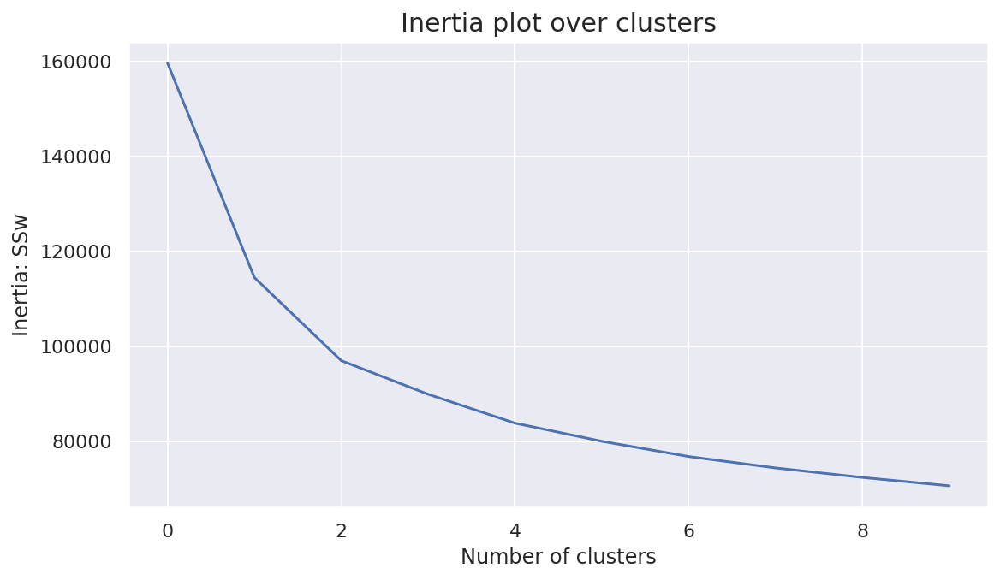

In [ ]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

In [ ]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(ds[metric_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(ds[metric_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

For n_clusters = 2, the average silhouette_score is : 0.2543073543818958
For n_clusters = 3, the average silhouette_score is : 0.20398842415769533
For n_clusters = 4, the average silhouette_score is : 0.1736563536263577
For n_clusters = 5, the average silhouette_score is : 0.13907791423545382
For n_clusters = 6, the average silhouette_score is : 0.13047366233763585
For n_clusters = 7, the average silhouette_score is : 0.12228185874579742
For n_clusters = 8, the average silhouette_score is : 0.11493466377632296
For n_clusters = 9, the average silhouette_score is : 0.10627361847715716
For n_clusters = 10, the average silhouette_score is : 0.1066722809329268


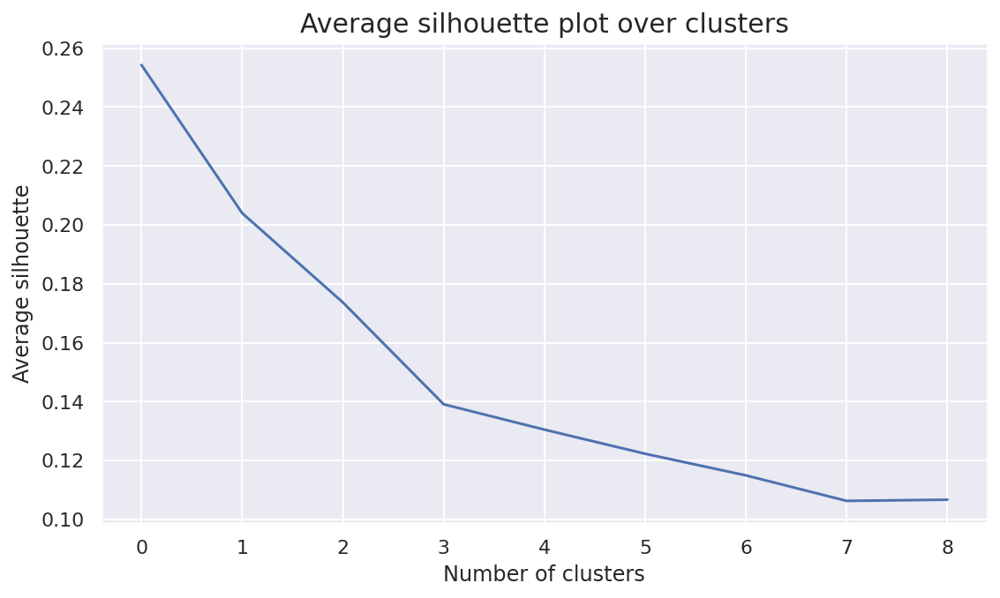

In [ ]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

###Final K-means Clustering Solution

In [ ]:
# final cluster solution
number_clusters = 3
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(ds[metric_features])
km_labels

array([1, 1, 2, ..., 1, 1, 1], dtype=int32)

In [ ]:
# Characterizing the final clusters
ds_concat = pd.concat((ds, pd.Series(km_labels, name='labels')), axis=1)
ds_concat.groupby('labels').mean()

,Custid,Dayswus,Age,Educ,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,Access,PC0,PC1,PC2
labels,,,,,,,,,,,,,,,,,,,,,
0.0,5424.357177,-0.006428,-0.000514,0.007857,-0.000786,0.396757,0.499762,-0.012678,-0.012221,-0.011632,...,0.012797,0.013723,0.014290,-0.009534,0.009196,-0.003118,-0.008086,-0.014955,0.027409,-0.015412
1.0,5440.551763,0.012147,0.007845,0.020066,0.011706,0.389722,0.511628,0.006199,0.013993,0.004056,...,-0.026486,-0.030605,-0.002367,-0.015341,0.001975,-0.001672,-0.005137,0.017482,-0.043950,0.000416
2.0,5451.711706,0.003628,-0.006249,-0.010177,-0.009843,0.389874,0.500484,0.006864,-0.011167,0.007465,...,0.006993,0.009615,-0.009113,0.002631,-0.014958,-0.001637,0.004169,0.007765,0.004240,0.007906
